# AOS_PS1_lsstCam_high

## 9010121 : lsstCam high extra qckBkgndPert00.cmd

Run on hyak with 

    python /gscratch/astro/suberlak/aos/AOS/run_ps1_phosim.py --instruments lsstCam --fields high --positions extra --root_dir /gscratch/astro/suberlak/aos/AOS/DM-28360 --cmd_file qckBkgndPert00_hyak.cmd --phosim_path /gscratch/astro/brycek/ts_repos/phosim_syseng4/phosim.py --phosim_p 192

Moved the raw amp data to NCSA (running on hyak the following : 

    scp -rp /gscratch/astro/suberlak/aos/AOS/DM-28360/lsstCam/high/extra/9010121/raw/  scichris@lsst-login01.ncsa.illinois.edu:/project/scichris/aos/AOS/DM-28360/lsstCam/high/extra/9010121/raw/

) 

Repackaged (on NCSA LSP): 

    phosim_repackager.py /project/scichris/aos/AOS/DM-28360/lsstCam/high/extra/9010121/raw/raw     --out_dir /project/scichris/aos/AOS/DM-28360/lsstCam/high/extra/9010121/repackaged --inst lsst --focusz -1500

Ingested and ISRd:

    python run_ps1_3_butler.py --obshistids 9010121
    
    

In [1]:
from lsst.daf import butler as dafButler
import lsst.afw.cameraGeom.utils as cameraGeomUtils
import lsst.afw.display as afwDisplay
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval

import numpy as np 
import os 
rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18
def plot_raw_postISR(repo_dir,instrument,detector='R22_S11'):
    
    butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                     f'{instrument}/calib','run1',
                                                     f'{instrument}/calib/unbounded'],
                             )


    # this is just to get the exposure  number
    # so that we don't have  to guess...
    dataId0 = dict(instrument=instrument)
    dataset = next(iter(
                        butler.registry.queryDatasets(
                            datasetType='postISRCCD', 
                            collections=['run1'],
                            dataId=dataId0  )
                        )
                   )
    exp_num = dataset.dataId["exposure"]
    print(exp_num)
    zscale = ZScaleInterval()
     
    # initialize the figure 
    fig,ax = plt.subplots(1,2,figsize=(18,9))

    # get the raw exposure 
    exposure = butler.get('raw', detector=detector, instrument=instrument,
              exposure=exp_num,)

    data = exposure.image.array
    vmin, vmax = zscale.get_limits(data)
    ax[0].imshow(exposure.image.array, vmin=vmin,vmax=vmax,cmap='Greys',
                origin='lower')

    ax[0].set_title("raw")
    ax[0].set_xlabel('x [px]')
    ax[0].set_ylabel('y [px]')

    # get the postISR exposure 
    exposure = butler.get('postISRCCD', detector=detector, instrument=instrument,
              exposure=exp_num,collections=['run1'])

    data = exposure.image.array
    vmin, vmax = zscale.get_limits(data)
    ax[1].imshow(exposure.image.array, vmin=vmin,vmax=vmax,cmap='Greys',
                origin='lower')

    ax[1].set_title("postISR")
    ax[1].set_xlabel('x [px]')
    ax[1].set_ylabel('y [px]')
    fig.suptitle(f"{instrument} {exposure.getDetector().getName()}",
                fontsize=18)

    

Show the high extra field for few sensors:

In [6]:
#These two parameters are the same for all cells below:
instrument='LSSTCam'
repo_dir = '/project/scichris/aos/AOS/DM-28360/lsstCam/high/extra/9010121/DATA/'

The corner intra-focal SW1, i.e. 'high', has a smaller z-coord in CCS. Since we moved by -1500 in  phosim coordinates, this implies moving  by  +1500 in CCS, which brings this sensor from z_CCS = -1500 to  z_CCS = -1500+1500 =  0, i.e. now it is in-focus:

4021123110121


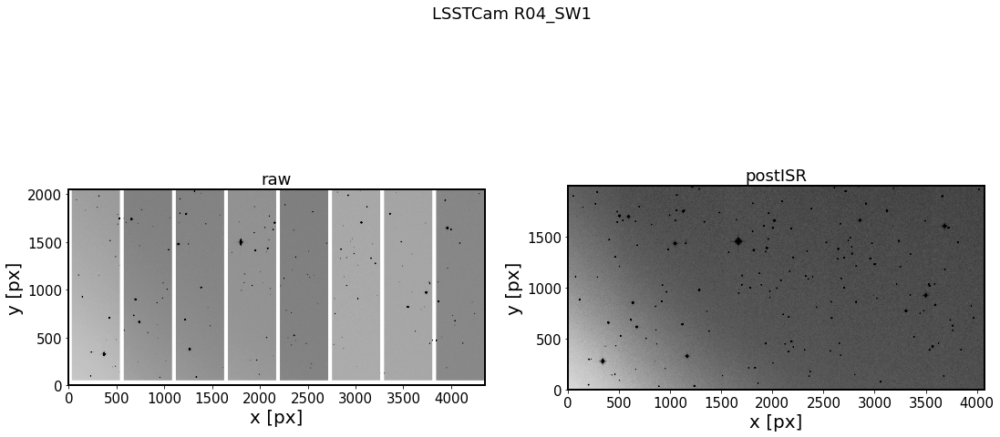

In [3]:
plot_raw_postISR(repo_dir,instrument, detector='R04_SW1') 

Likewise, the corner extra-focal SW0, i.e. 'low', has a larger z-coord in CCS. Moving by +1500 along +z in CCS brings it more out of focus (from z_CCS=+1500 now it is at z_CCS = 1500+1500 = +3000), i.e. the donuts will be too large:

4021123110121


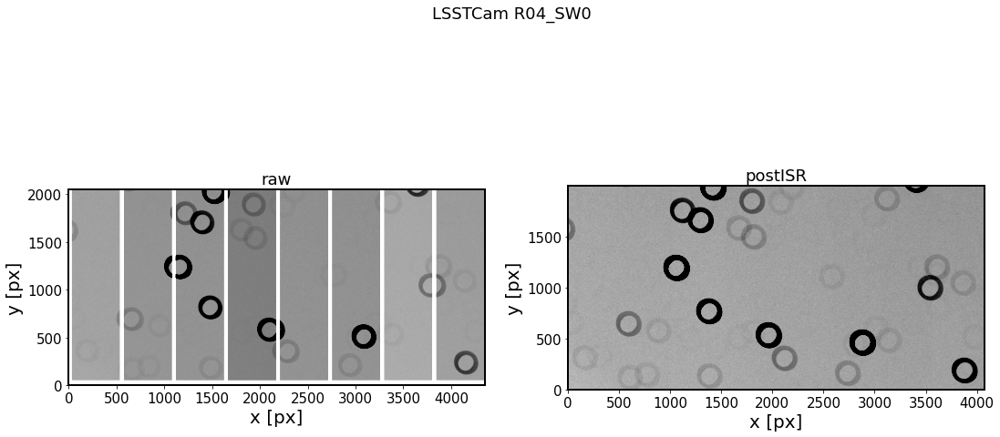

In [5]:
plot_raw_postISR(repo_dir,instrument, detector='R04_SW0') 

And all other sensors are moved from z_CCS = 0 to z_CCS = +1500 , i.e. they are out of focus: 

4021123110121


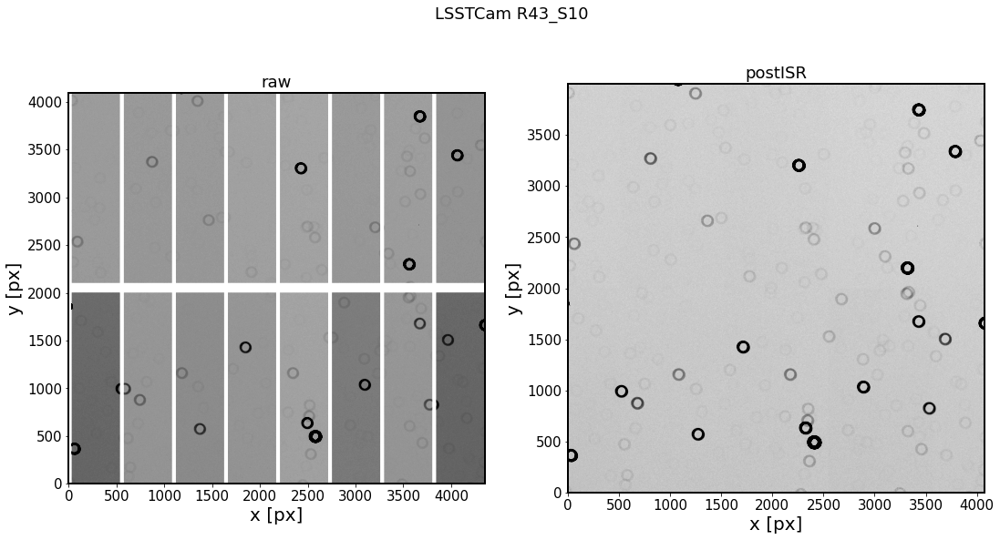

In [7]:
plot_raw_postISR(repo_dir,instrument, detector='R43_S10') 

The FAMcam sensors on the edges (R34_S22, R14_S02, R30_S20, R10_S00)  have very strong vignetting:

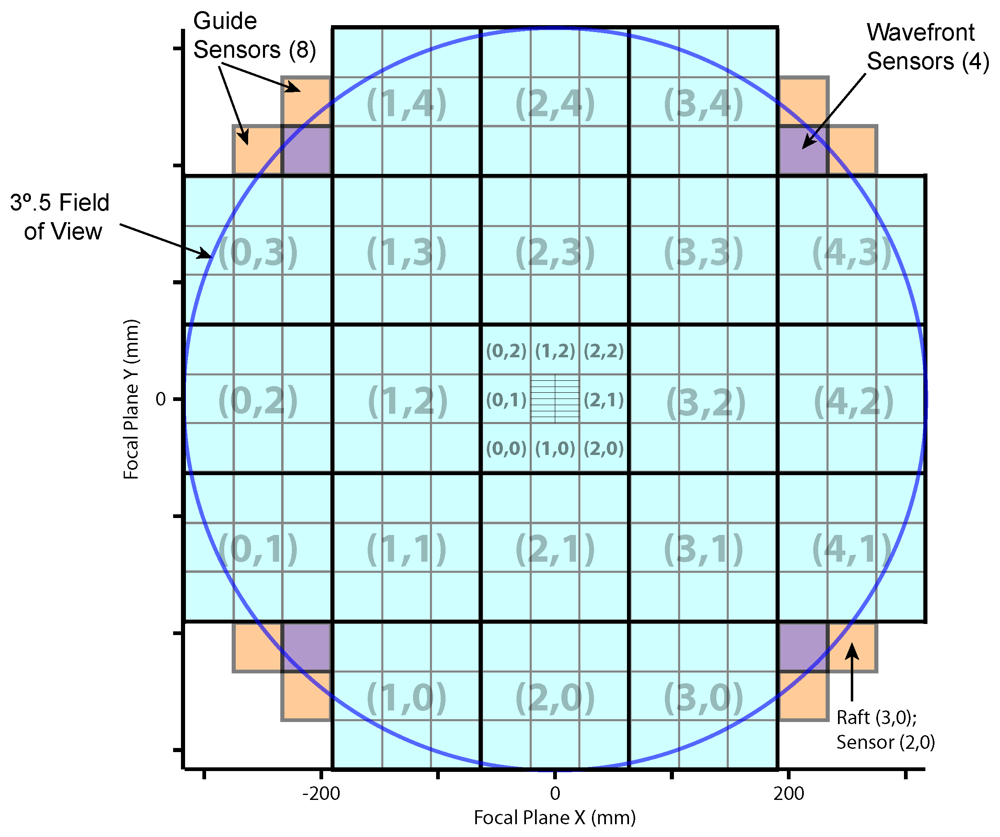

Upper-right corner:

4021123110121


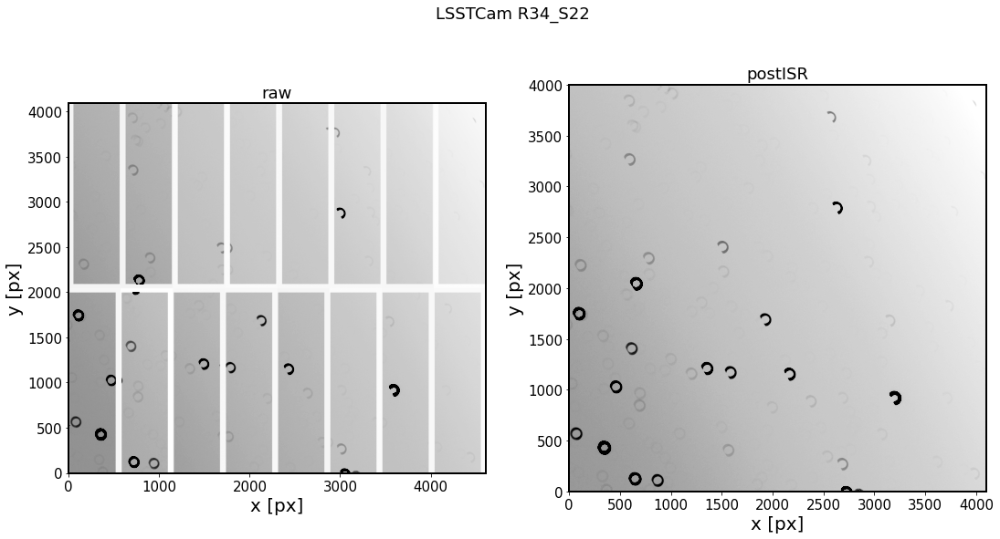

In [8]:
plot_raw_postISR(repo_dir,instrument, detector='R34_S22') 

Upper-left corner:

4021123110121


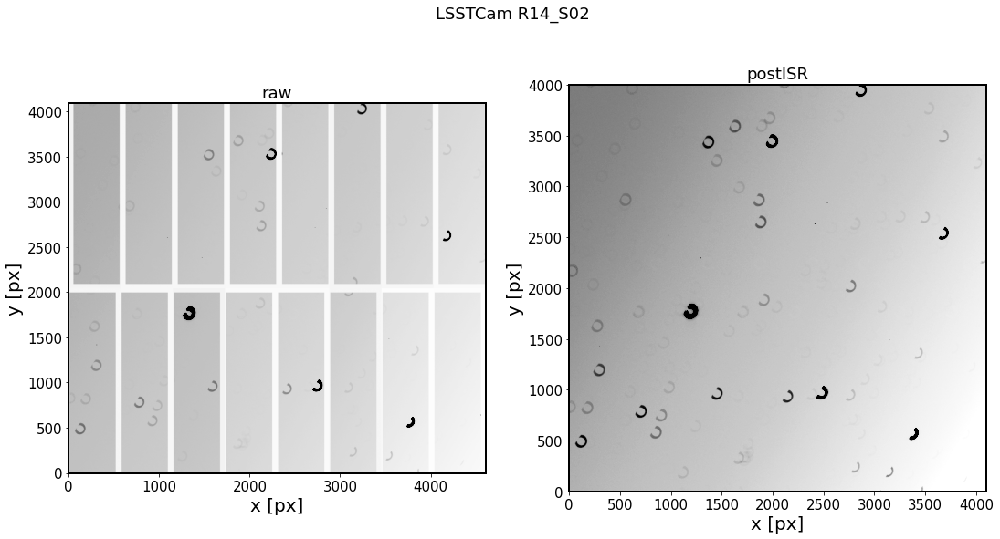

In [9]:
plot_raw_postISR(repo_dir,instrument, detector='R14_S02') 

Bottom-left:

4021123110121


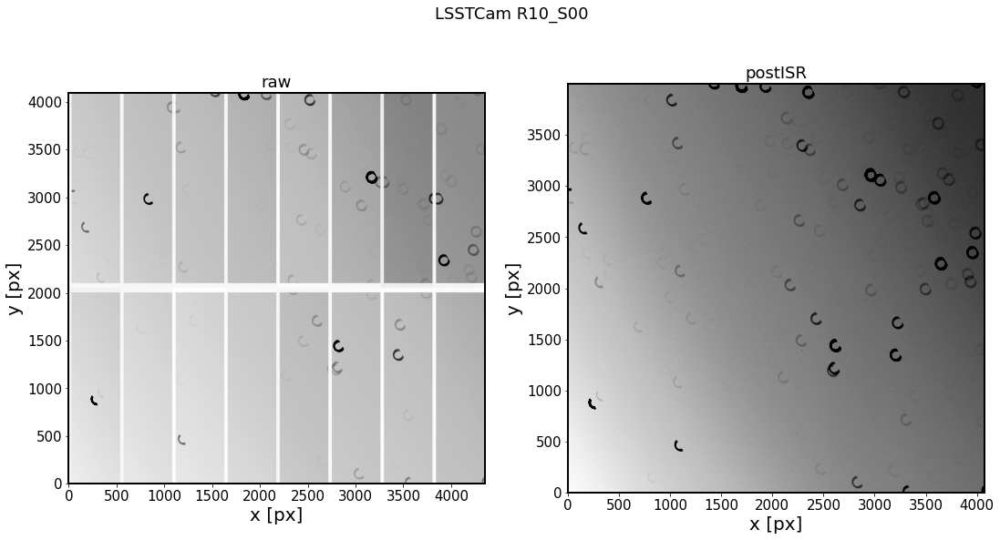

In [10]:
plot_raw_postISR(repo_dir,instrument, detector='R10_S00') 

Bottom-right:

4021123110121


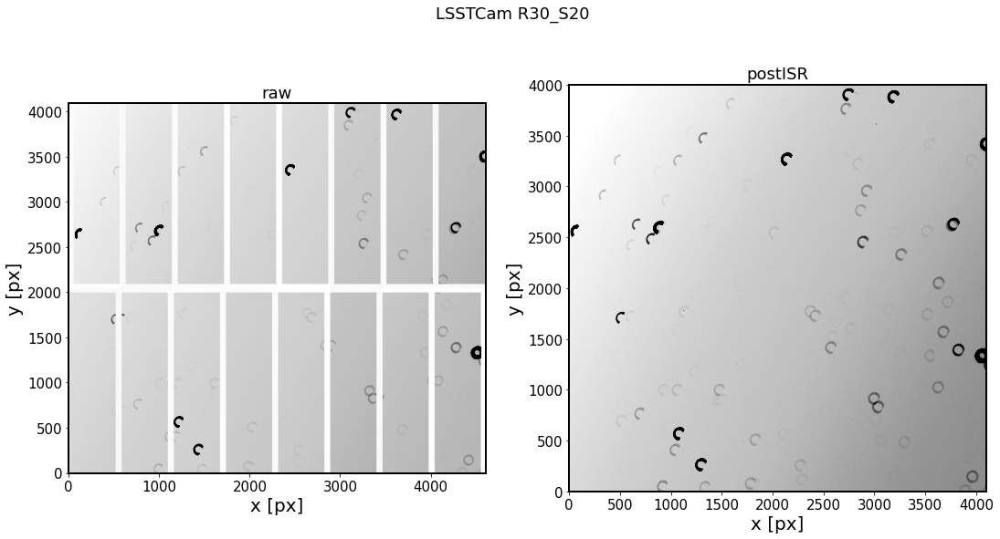

In [11]:
plot_raw_postISR(repo_dir,instrument, detector='R30_S20') 

Show a sensor somewhere in the middle:

4021123110121


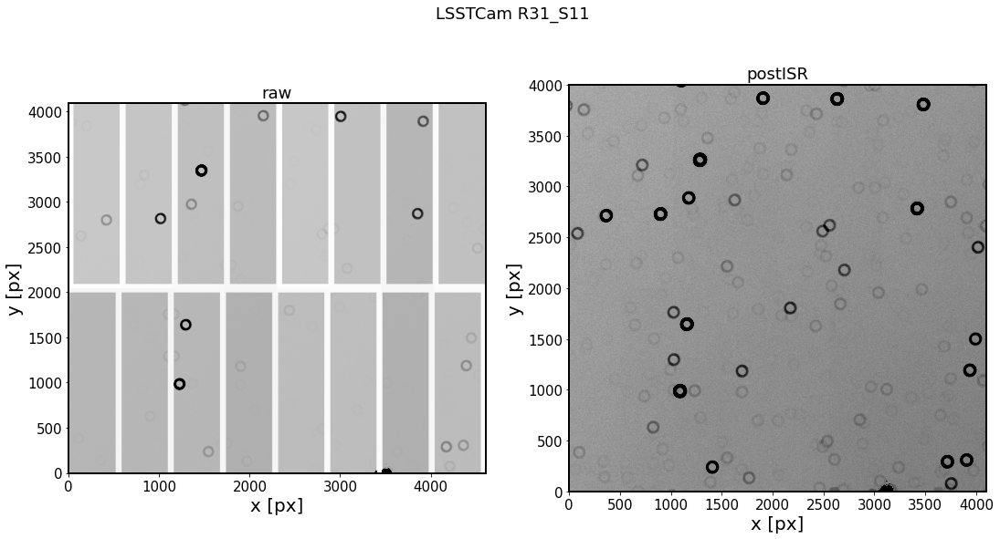

In [12]:
plot_raw_postISR(repo_dir,instrument, detector='R31_S11') 

Use `cameraGeom` to plot the entire focal plane:

In [13]:
afwDisplay.setDefaultBackend("matplotlib")

repo_dir = os.path.join('/project/scichris/aos/AOS/DM-28360/lsstCam/high/extra/9010121/DATA/')

# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

exposure = dataset.dataId["exposure"]

camera  = butler.get("camera", instrument=instrument, exposure=exposure)

Reading 189: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 189, exposure: 4021123110121} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 190: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 190, exposure: 4021123110121} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 193: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 193, exposure: 4021123110121} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 194: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 194, exposure: 4021123110121} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 197: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 197, exposure: 4021123110121} could not be found in collections [LSSTCam/raw/all, LSSTCam

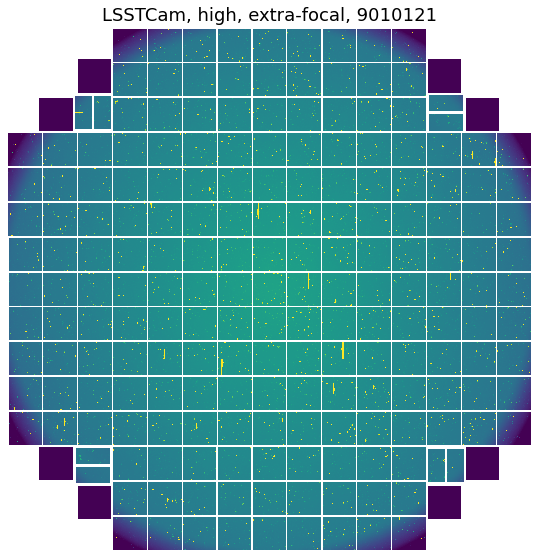

In [50]:
fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"


# use that  to limit what's shown
#detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

# set to None to plot everything
detectorNameList = None
mos = cameraGeomUtils.showCamera(camera,
                             cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=False, title=f'{instrument}, high, extra-focal, 9010121' )
                             
disp.show_colorbar(False)
ax.axis("off")

plt.savefig('LsstCam_high_extra_9010121.png', bbox_inches='tight')

In [81]:
cameraGeomUtils.showCamera?

Signature:
cameraGeomUtils.showCamera(
    camera,
    imageSource=<lsst.afw.cameraGeom.utils.FakeImageDataSource object at 0x7fea6bc2a220>,
    imageFactory=<class 'lsst.afw.image.image.ImageF'>,
    detectorNameList=None,
    binSize=10,
    bufferSize=10,
    overlay=True,
    title='',
    showWcs=None,
    ctype='green',
    textSize=1.25,
    originAtCenter=True,
    display=None,
    **kwargs,
)
Docstring:
Show a Camera on display, with the specified display.

The rotation of the sensors is snapped to the nearest multiple of 90 deg.
Also note that the pixel size is constant over the image array. The lower
left corner (LLC) of each sensor amp is snapped to the LLC of the pixel
containing the LLC of the image.

Parameters
----------
camera : `lsst.afw.cameraGeom.Camera`
    Camera object to use to make the image.
imageSource : `FakeImageDataSource` or `None`
    Source to get ccd images.  Must have a ``getCcdImage()`` method.
imageFactory : `lsst.afw.image.Image`
    Type of image

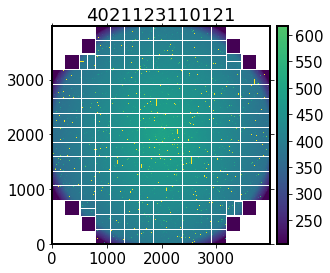

<Figure size 720x720 with 0 Axes>

In [56]:
disp = afwDisplay.Display(1, reopenPlot=True)
disp.setImageColormap('viridis')# if False else 'gray')
disp.scale('asinh', 'zscale', Q=2)
disp.mtv(mos)

plt.title(f'{dataset.dataId["exposure"]}');

plt.savefig('LsstCam_high_extra_9010121.png', bbox_inches='tight')

In [ ]:


disp.?




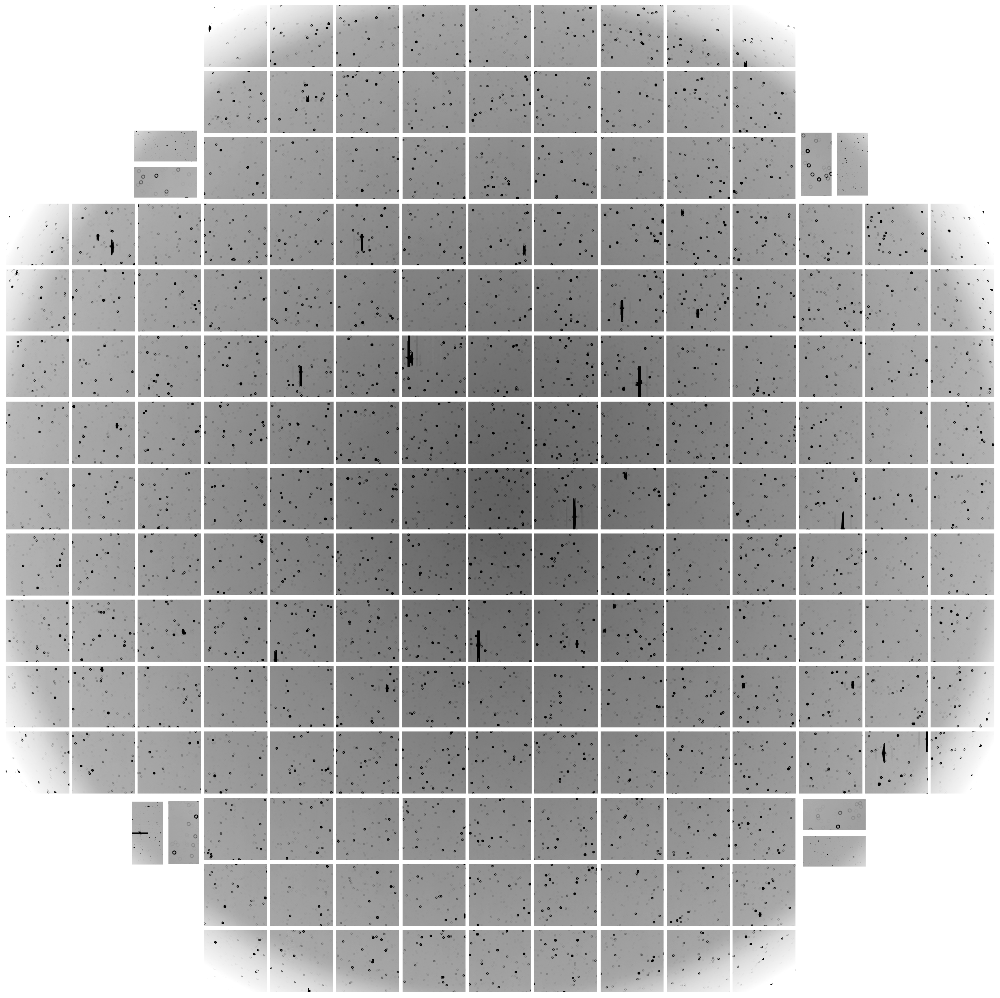

In [79]:
fig,ax = plt.subplots(1,1,figsize=(45,45))
zscale = ZScaleInterval()
vmin, vmax = zscale.get_limits(mos.array)
ax.imshow(mos.array, cmap='Greys', vmin=vmin,vmax=vmax)
ax.axis("off")
plt.savefig("LsstCam_high_extra_9010121_bw_hires.png",dpi=150)

In [82]:
np.shape(mos.array)

(3974, 3980)

In [83]:
15*4000

60000

The shape is that much smaller than  approx 15*4000px = 60000 px  across, because it has been binned by a factor of 16:

The true dimensions (if binning was set to 1) would be  16 * 3974=63584, by 16*3980=63680

In [86]:
16*3980

63680

# LsstCam High Focal Small Pert00 Qck Background 9010021 

There are already some repackaged files... I'm not sure how they were created, so I moved that to `repackaged_old`. It says they were made Jul 2nd, but how is that possible? (given that phosim crashed...) 


There are 55 sensors in `repackaged_old` ... 





Splitting 205 sensors of LsstCam into 5 groups 41 sensors each. Once each group is completed, repackage. Achieved by adding the following kwargs to `run_ps1_phosim.py`:

    --splitSensorsIntoGroups   True / False 
    --Ngroups  5 
    --selectGroup 1,2,3,4... 
    
    
Also, adding these to `run_ps1_slurm`, so that 5 individual slurm files can be made and submitted automatically (and if everything crashes, make smaller ones). 


Also, log which version of phosim,  phosim_repackager is used  in README 

Perhaps even copy the focalplanelayout and segmentation  that were used to readme/



python /home/scichris/notebooks/run_ps1_phosim.py --instruments lsstCam --fields high --positions focal  --cmd_file qckBkgndPert00_hyak.cmd  --phosim_p 192 --dry_run 


python /home/scichris/notebooks/run_ps1_phosim.py --instruments lsstCam --fields high --positions focal  --cmd_file qckBkgndPert00_hyak.cmd  --phosim_p 192 --split  --dry_run 



python /home/scichris/notebooks/run_ps1_slurm.py --instruments lsstCam --fields high --positions focal  --backgrounds qck --perts 00  --suffix NCSA   --phosim_p 192  --job_prefix lsHi  --split --suffix hyak --dry_run 

python /home/scichris/notebooks/run_ps1_phosim.py --instruments lsstCam --fields high --positions focal  --cmd_file qckBkgndPert00_hyak.cmd  --phosim_p 192 --split --select_group 2  --dry_run 



python /home/scichris/notebooks/run_ps1_slurm.py --root_dir /gscratch/astro/suberlak/aos/AOS/DM-28360/ --slurm_path /gscratch/astro/suberlak/aos/ --phosim_path /gscratch/astro/brycek/ts_repos/phosim_syseng4/phosim.py  --instruments lsstCam --fields high --positions focal  --backgrounds qck --perts 00  --suffix NCSA   --phosim_p 60  --nodes 3 --job_prefix lsHi  --split --suffix hyak --dry_run 

    ssh  suberlak@mox.hyak.uw.edu 

    screen -S aos   # to start the screen  
    source /gscratch/astro/suberlak/aos/setup_aos.sh
    
    python /gscratch/astro/suberlak/aos/AOS/run_ps1_slurm.py --root_dir /gscratch/astro/suberlak/aos/AOS/DM-28360/ --slurm_path /gscratch/astro/suberlak/aos/ --phosim_path /gscratch/astro/brycek/ts_repos/phosim_syseng4/phosim.py  --instruments lsstCam --fields high --positions focal  --backgrounds qck --perts 00  --suffix NCSA   --phosim_p 60  --nodes 3 --job_prefix lsHi  --split --suffix hyak --dry_run 
    
yields 

    Segmentation fault

so I do 
    
    gdb python
    
    run /gscratch/astro/suberlak/aos/AOS/run_ps1_slurm.py --root_dir /gscratch/astro/suberlak/aos/AOS/DM-28360/ --slurm_path /gscratch/astro/suberlak/aos/ --phosim_path /gscratch/astro/brycek/ts_repos/phosim_syseng4/phosim.py  --instruments lsstCam --fields high --positions focal  --backgrounds qck --perts 00  --suffix NCSA   --phosim_p 60  --nodes 3 --job_prefix lsHi  --split --suffix hyak --dry_run
    
    
gets 

       [Thread debugging using libthread_db enabled]
        Using host libthread_db library "/lib64/libthread_db.so.1".
        [New Thread 0x7fffee1e1700 (LWP 11688)]
        [New Thread 0x7fffed9e0700 (LWP 11689)]
        [New Thread 0x7fffe51df700 (LWP 11690)]
        [New Thread 0x7fffdc9de700 (LWP 11691)]
        [New Thread 0x7fffd41dd700 (LWP 11692)]
        [New Thread 0x7fffcb9dc700 (LWP 11693)]
        [New Thread 0x7fffc31db700 (LWP 11694)]
        [New Thread 0x7fffba9da700 (LWP 11695)]
        [New Thread 0x7fffb21d9700 (LWP 11696)]
        [New Thread 0x7fffa99d8700 (LWP 11697)]
        [New Thread 0x7fffa11d7700 (LWP 11698)]
        [New Thread 0x7fff989d6700 (LWP 11699)]
        [New Thread 0x7fff901d5700 (LWP 11700)]
    [New Thread 0x7fff879d4700 (LWP 11701)]
    [New Thread 0x7fff7f1d3700 (LWP 11702)]
    [New Thread 0x7fff769d2700 (LWP 11703)]
    [New Thread 0x7fff6e1d1700 (LWP 11704)]
    [New Thread 0x7fff659d0700 (LWP 11705)]
    [New Thread 0x7fff5d1cf700 (LWP 11706)]
    [New Thread 0x7fff549ce700 (LWP 11707)]
    [New Thread 0x7fff4c1cd700 (LWP 11708)]
    [New Thread 0x7fff439cc700 (LWP 11709)]
    [New Thread 0x7fff3b1cb700 (LWP 11710)]
    [New Thread 0x7fff329ca700 (LWP 11711)]
    [New Thread 0x7fff2a1c9700 (LWP 11712)]
    [New Thread 0x7fff219c8700 (LWP 11713)]
    [New Thread 0x7fff191c7700 (LWP 11714)]
    [New Thread 0x7fff109c6700 (LWP 11715)]
    [New Thread 0x7fff081c5700 (LWP 11716)]
    [New Thread 0x7ffeff9c4700 (LWP 11717)]
    [New Thread 0x7ffef71c3700 (LWP 11718)]
    [New Thread 0x7ffeee9c2700 (LWP 11719)]
    [New Thread 0x7ffee61c1700 (LWP 11720)]
    [New Thread 0x7ffedd9c0700 (LWP 11721)]
    [New Thread 0x7ffed51bf700 (LWP 11722)]
    [New Thread 0x7ffecc9be700 (LWP 11723)]
    [New Thread 0x7ffec41bd700 (LWP 11724)]

    Program received signal SIGSEGV, Segmentation fault.
    [Switching to Thread 0x7ffec41bd700 (LWP 11724)]
    0x0000000000000000 in ?? ()
    Missing separate debuginfos, use: debuginfo-install glibc-2.17-324.el7_9.x86_64

so I do 
    
    backtrace 
    
and I get 

    #0  0x0000000000000000 in ?? ()
    #1  0x00007fffee711523 in blas_memory_alloc ()
       from /gscratch/astro/suberlak/lsst_stack/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.5.0/lib/python3.8/site-packages/numpy/core/../../../../libcblas.so.3
    #2  0x00007fffee711d15 in blas_thread_server ()
       from /gscratch/astro/suberlak/lsst_stack/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.5.0/lib/python3.8/site-packages/numpy/core/../../../../libcblas.so.3
    #3  0x00007ffff7bc6ea5 in start_thread () from /lib64/libpthread.so.0
    #4  0x00007ffff6fde9fd in clone () from /lib64/libc.so.6


    ...
    
    ctrl+a, d # to detach from the screen 
    
    ...
    
    screen -x aos # to join  later 
    
    
    

python /gscratch/astro/suberlak/aos/AOS/run_ps1_slurm.py --root_dir /gscratch/astro/suberlak/aos/AOS/DM-28360/ --slurm_path /gscratch/astro/suberlak/aos/ --phosim_path /gscratch/astro/brycek/ts_repos/phosim_syseng4/phosim.py  --instruments lsstCam --fields high --positions focal  --backgrounds qck --perts 00  --suffix NCSA   --phosim_p 60  --nodes 3 --job_prefix lsHi  --split --suffix hyak --dry_run 

well, since I'm getting segmentation fault on hyak,  let's try submitting that on NCSA:



    ssh lsst-devl02 
    
    python /project/scichris/aos/AOS/run_ps1_slurm.py --root_dir /project/scichris/aos/AOS/DM-28360/ --instruments lsstCam --fields high --positions focal  --backgrounds qck --perts 00  --suffix NCSA   --phosim_p 60  --nodes 3 --ntasks 72 --job_prefix lsHi  --split --dry_run 

    python /project/scichris/aos/AOS/run_ps1_phosim.py --instruments lsstCam --fields high --positions focal --phosim_p 60 --cmd_file qckBkgndPert00_NCSA.cmd --root_dir /project/scichris/aos/AOS/DM-28360/  --phosim_path /project/scichris/aos/phosim_syseng4/phosim.py --split  --group_number 5  --select_group 3

Now also try using condor: 


put the following in `/project/scichris/aos/ps1_phosim/condorRunPython.sh`:
    
    
    #!/bin/sh
    python /project/scichris/aos/AOS/run_ps1_phosim.py --instruments lsstCam --fields high --positions focal --cmd_file qckBkgndPert00_hyak.cmd --phosim_p 192 --split --select_group 2 --dry_run
    
make it executable:
    
    chmod 777 condorRunPython.sh
    
Put the following in the submit script `condor.job.submit`:

    executable = condorRunPython.sh 
    log = job.log.$(ClusterId).$(ProcId)
    output = job.out.$(ClusterId).$(ProcId)
    error = job.err.$(ClusterId).$(ProcId)
    request_cpus = 9
    request_memory = 3G
    queue 1
    
    
The guide is at https://developer.lsst.io/services/batch.html#batch-condor  and https://htcondor.readthedocs.io/en/latest/users-manual/quick-start-guide.html


Submit the job with 

    condor_submit  condor.job.submit
    
    
See the status with 

    condor_status -avail 
    
    condor_q
    
    
    

## 9010021 : lsstCam high focal qckBkgndPert00.cmd

4021123110021


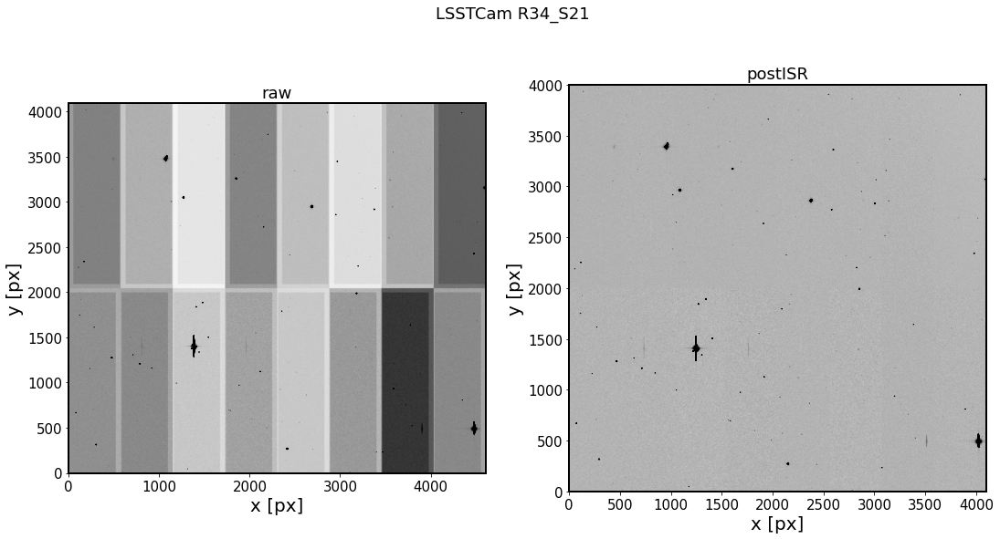

In [2]:
#These two parameters are the same for all cells below:
instrument='LSSTCam'
repo_dir = '/project/scichris/aos/AOS/DM-28360/lsstCam/high/focal/9010021/DATA/'

plot_raw_postISR(repo_dir,instrument, detector='R34_S21') 

4021123110021


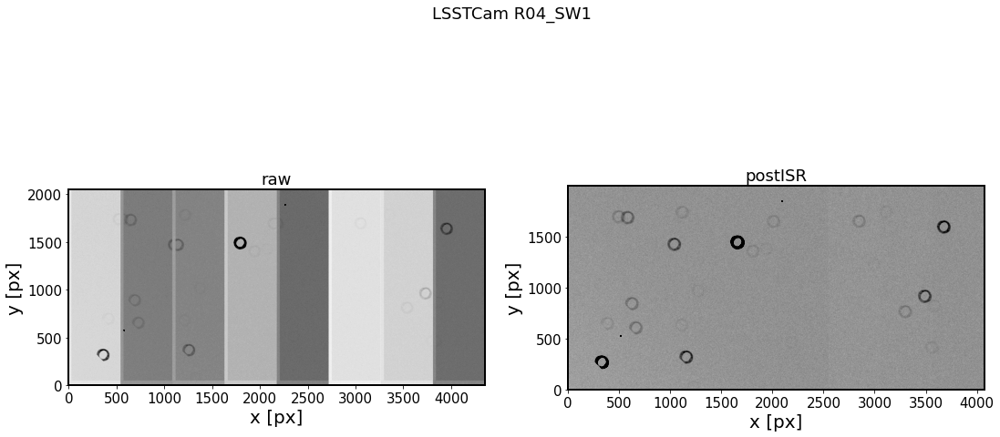

In [3]:
plot_raw_postISR(repo_dir,instrument, detector='R04_SW1') 

4021123110021


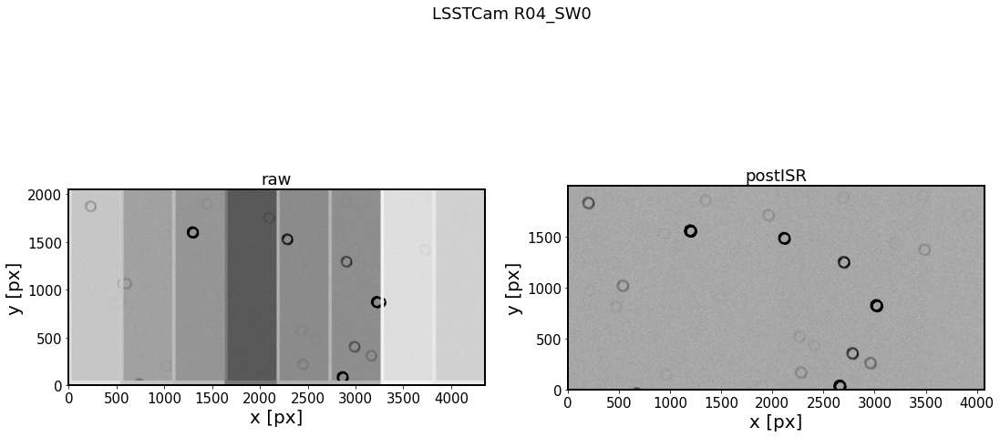

In [4]:
plot_raw_postISR(repo_dir,instrument, detector='R04_SW0') 

## Compare corners between high Pert00  extra, focal, intra 

In [8]:
import os
# show the raw image 
from lsst.daf import butler as dafButler
import lsst.afw.cameraGeom.utils as cameraGeomUtils
import lsst.afw.display as afwDisplay

import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval


def plot_cameraGeom(repo_dir = os.path.join('/project/scichris/aos/images/lsstCam/letter_lsstCam_entire_tiledF/DATA/'),
                   detectorNameList = [ "R04_SW0", "R04_SW1",
                         "R44_SW0", "R44_SW1",
                         "R00_SW0", "R00_SW1",
                         "R40_SW0", "R40_SW1",
                      
                       ] ,
                   ):
    afwDisplay.setDefaultBackend("matplotlib")

    #repo_dir = os.path.join('/project/scichris/aos/images/lsstCam/letter_lsstCam_entire_tiledF/DATA/')

    # need to specify the calib collections to be able to access the camera 
    instrument = 'LSSTCam'
    butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                     f'{instrument}/calib','run1',
                                                     f'{instrument}/calib/unbounded']
                             )

    dataId0 = dict(instrument=instrument)
    dataset = next(iter(
                        butler.registry.queryDatasets(
                            datasetType='postISRCCD', 
                            collections=['run1'],
                            dataId=dataId0  )
                        )
                   )

    exposure = dataset.dataId["exposure"]

    camera  = butler.get("camera", instrument=instrument, exposure=exposure)

    fig = plt.figure(figsize=(15,15))
    fig.subplots_adjust(hspace=0., wspace=0.0, )

    ax = fig.add_subplot(1, 1, 1)

    disp = afwDisplay.Display(fig)
    disp.scale('asinh', 'zscale', Q=2)
    #disp.scale('linear', 'minmax')
    #disp.scale('asinh', 5, 7000, Q=2)

    disp.setImageColormap('viridis' if True else 'gray')
    dataType = "postISRCCD"


    # use that  to limit what's shown
    #detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

    # set to None to plot everything
    
    mos = cameraGeomUtils.showCamera(camera,
                                 cameraGeomUtils.ButlerImage(butler, dataType, 
                                                             instrument=instrument, 
                                                             exposure=exposure,
                                                             verbose=True),
                                 binSize=16, 
                                 detectorNameList=detectorNameList, 
                                 display=disp, overlay=True, title=f'{instrument}' )

    disp.show_colorbar(False)
    ax.axis("off")

    #plt.savefig('LsstCam_letter_entire_tiledF_wfs.png', bbox_inches='tight')
    return mos




from matplotlib import rcParams 
rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18

import matplotlib.patheffects as path_effects

def plot_corner_with_annotations(mos,vmin,vmax):
    fig,ax = plt.subplots(1,1,figsize=(10,10))
    ax.imshow(mos.array.T, origin='lower',vmin=vmin,vmax=vmax)
    ax.set_xlabel('x px (CCS)')
    ax.set_ylabel('y px  (CCS)')
    yt = 100
    x0 = 50
    dx = 270
    dy = 270
    ct = 'orange'
    fw = 'bold'
    ax.text(x0,yt,'R33_S01',c=ct , fontweight=fw)#path_effects=[path_effects.Stroke(linewidth=1, foreground='yellow')])
    ax.text(x0+dx,yt,'R33_S11',c=ct, fontweight=fw)
    ax.text(x0+2*dx,yt,'R33_S21',c=ct,fontweight=fw)
    ax.text(x0+3*dx,yt,'R43_S01',c=ct ,fontweight=fw)
    ax.text(x0+4*dx,yt,'R43_S11',c=ct ,fontweight=fw)


    ax.text(x0+dx, yt+dy, 'R33_S12',c=ct ,fontweight=fw)
    ax.text(x0+dx, yt+2*dy, 'R34_S10',c=ct ,fontweight=fw)
    ax.text(x0+dx, yt+3*dy, 'R34_S11',c=ct ,fontweight=fw)

    ax.text(x0+2*dx,yt+dy, 'R33_S22',c=ct,fontweight=fw)
    ax.text(x0+3*dx,yt+dy, 'R43_S02',c=ct,fontweight=fw)

    ax.text(x0+2*dx,yt+2*dy, 'R34_S20',c=ct,fontweight=fw)

    ax.text(x0+2.9*dx,yt+2*dy, 'R44\nSW0', c=ct,fontweight=fw)
    ax.text(x0+3.45*dx,yt+2*dy, 'R44\nSW1', c=ct,fontweight=fw)


    xstart,ystart, width, height = 800,850, 200,200
    ax.arrow(xstart,ystart,width,0, head_width=25, head_length=20 ,lw=3)
    ax.arrow(xstart,ystart,0,height, head_width=25, head_length=20 ,lw=3)
    ax.text(xstart+width+30,ystart-10, 'RA')
    ax.text(xstart-25, ystart+height+30, 'DEC')

    ax.text(xstart+width, ystart+height/2., 'CCS', fontweight='extra bold', 
            fontsize=25, c='red')
    ax.axis("off")

    #plt.savefig('letter_lsstCam_entire_tiled_LSST_all_rot.jpg', bbox_inches='tight', dpi=150)


plot with `cameraGeom` just one corner 

**extra-focal** - the first one to run, before the 180 degree update 

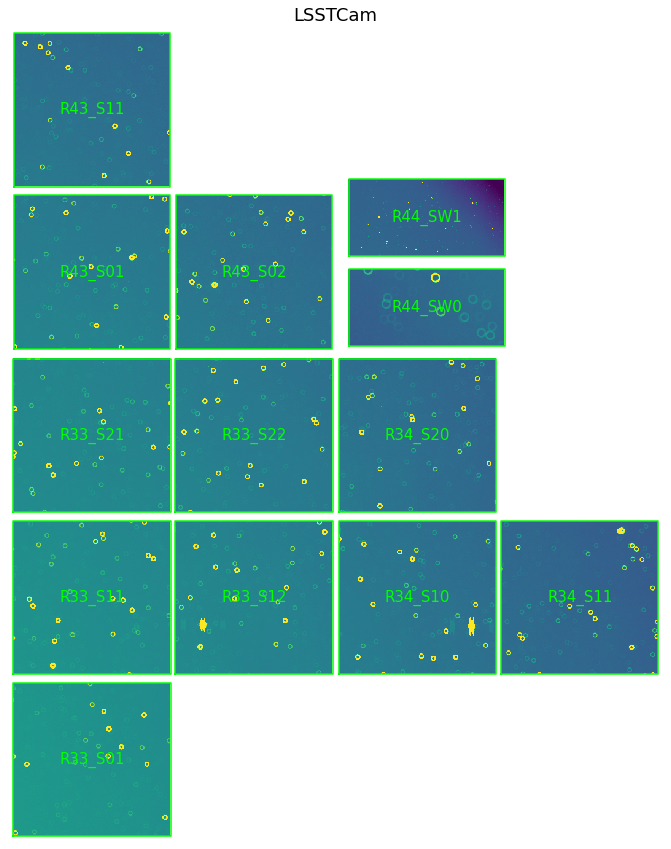

In [14]:

corner_list = ['R34_S11','R34_S10','R34_S20',
                                        'R33_S12','R33_S11','R33_S21','R33_S01','R33_S22',
                                       'R43_S01','R43_S11', 'R43_S02', 'R44_SW0', 'R44_SW1']
mos = plot_cameraGeom(repo_dir = 
                '/project/scichris/aos/AOS/DM-28360/lsstCam/high/extra/9010121/DATA/',
                      detectorNameList=corner_list
               )

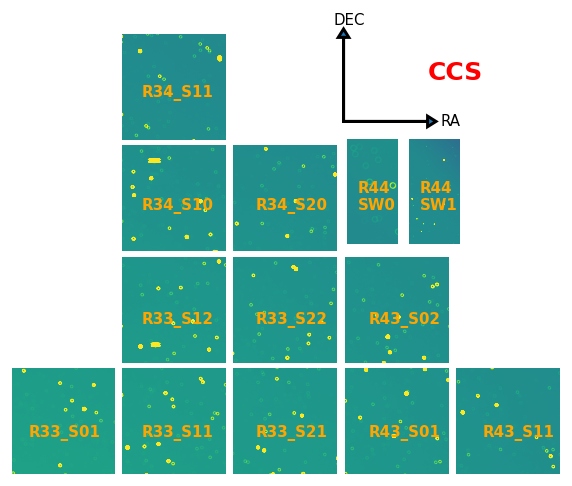

In [15]:
plot_corner_with_annotations(mos,vmin=50,vmax=750)

**Focal, corner:**

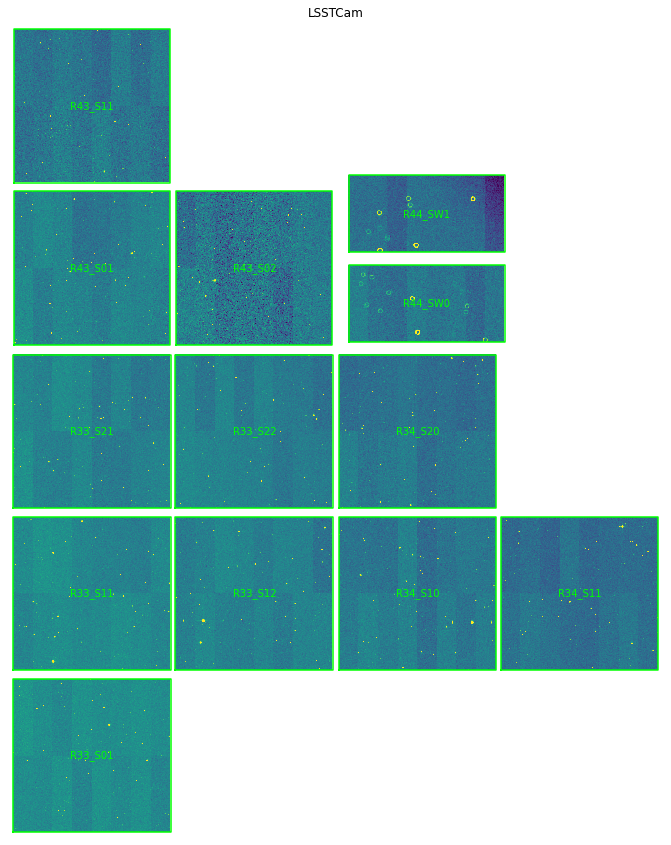

In [3]:

corner_list = ['R34_S11','R34_S10','R34_S20',
                                        'R33_S12','R33_S11','R33_S21','R33_S01','R33_S22',
                                       'R43_S01','R43_S11', 'R43_S02', 'R44_SW0', 'R44_SW1']
mos = plot_cameraGeom(repo_dir = 
                '/project/scichris/aos/AOS/DM-28360/lsstCam/high/focal/9010021/DATA/',
                      detectorNameList=corner_list
               )

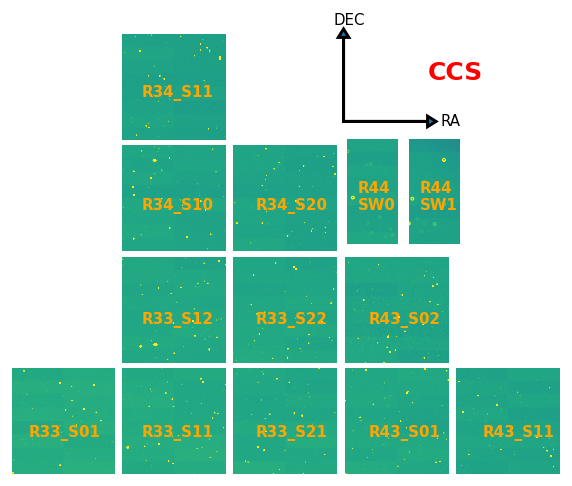

In [5]:
plot_corner_with_annotations(mos)

**intra-focal, corner:** - used new SW0 focalplanelayout 

--> still running ! as soon as done,  ingest with butler, and plot below to show whether the new or the old focalplanelayout was used ... 

In [18]:
mos = plot_cameraGeom(repo_dir = 
                '/project/scichris/aos/AOS/DM-28360/lsstCam/high/intra/9010221/DATA',
                      detectorNameList=corner_list
               )

FileNotFoundError: Config location file:///project/scichris/aos/AOS/DM-28360/lsstCam/high/intra/9010221/DATA does not exist.

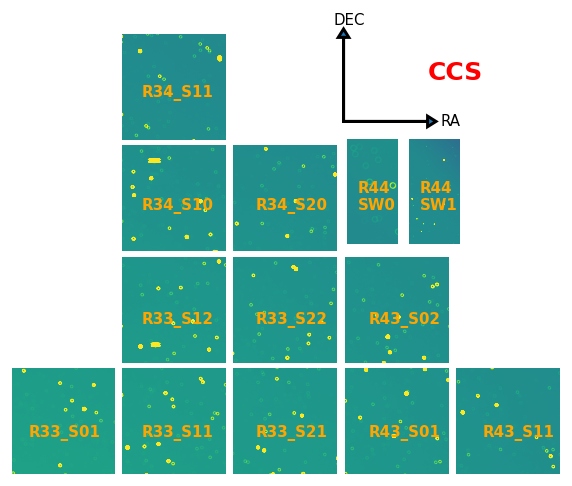

In [19]:
plot_corner_with_annotations(mos,vmin=50,vmax=750)

In [ ]:
consider the WCS - show that since the `focal` and `intra` were run with updated focalplanelayout.txt,  the 

## High focal Pert00 - plot full focal plane 

Reading 189: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 189, exposure: 4021123110021} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 190: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 190, exposure: 4021123110021} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 193: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 193, exposure: 4021123110021} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 194: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 194, exposure: 4021123110021} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 197: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 197, exposure: 4021123110021} could not be found in collections [LSSTCam/raw/all, LSSTCam

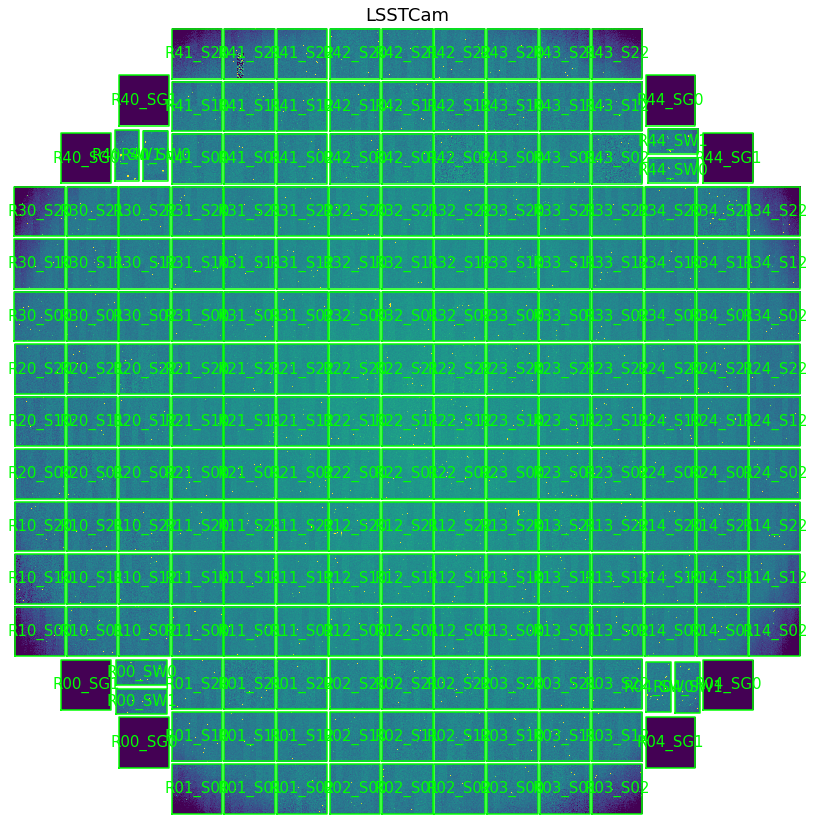

In [7]:
mos = plot_cameraGeom(repo_dir = 
                '/project/scichris/aos/AOS/DM-28360/lsstCam/high/focal/9010021/DATA/',
                      detectorNameList=None
               )

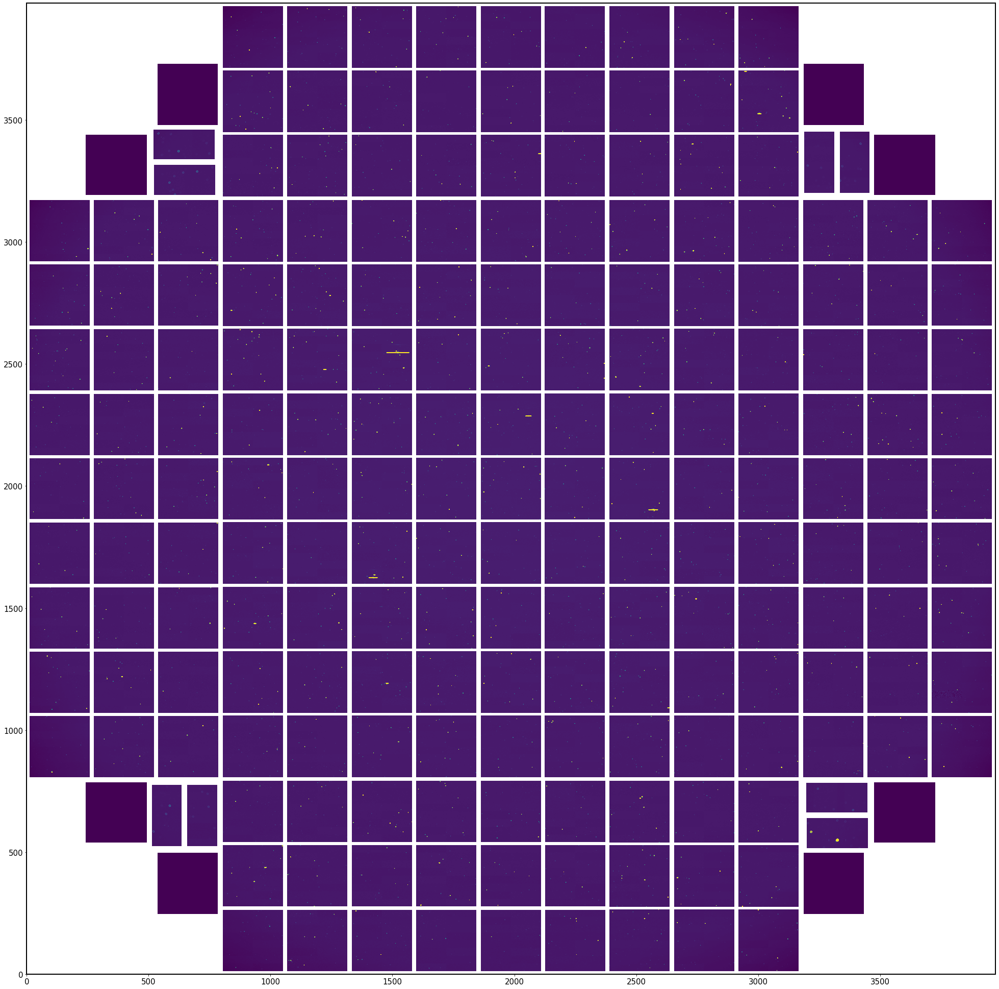

In [26]:
fig,ax = plt.subplots(1,1,figsize=(35,35))
ax.imshow(mos.array.T, origin='lower', vmax=200, vmin=0)
plt.savefig('lsstCam_high_focal_qckBkgndPert00.pdf', bbox_inches='tight', dpi=150)

In [10]:
#plt.hist(mos.array.T)

plt.hist(np.ravel(mos.array.T), range=(20,2000))

## 9010221 lsstCam high intra qckBkgndPert00.cmd 

In [ ]:
--> still running... 

In [ ]:
cd /project/scichris/aos/AOS/DM-28360/lsstCam/high/intra/9010221
